# Capstone 3: Rossmann Store Analysis

![alt text](https://drive.google.com/uc?export=view&id=1lqxtH3UqdhFFlQrmsaHHcfJ8UkzXg5vx)


## Objective

We will be analyzing the Rossmann sales data set that can be found at https://www.kaggle.com/c/rossmann-store-sales/ Our objective is to find relationships, if any, exist between several different store location characteristics, number of customers and total sales.

## Import libraries and set up the dataframe.

Import Libraries

In [1]:
# Import the needed libraries
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/gdrive')
sns.set()

Mounted at /content/gdrive


Install Pandas Profiling, enable widgets and import the profiling fuction

In [2]:
# Install Pandas Profiling via pip
! pip install -U pandas-profiling[notebook]

# Enable the widget extension in Jupyter
! jupyter nbextension enable --py widgetsnbextension

# Import pandas profile
from pandas_profiling import ProfileReport

     |████████████████████████████████| 245kB 5.3MB/s 
     |████████████████████████████████| 604kB 5.7MB/s 
     |████████████████████████████████| 3.1MB 11.8MB/s 
     |████████████████████████████████| 61kB 7.5MB/s 
     |████████████████████████████████| 81kB 9.5MB/s 
     |████████████████████████████████| 81kB 9.1MB/s 
     |████████████████████████████████| 112kB 39.9MB/s 
     |████████████████████████████████| 296kB 34.8MB/s 
  Created wheel for phik: filename=phik-0.11.1-cp37-none-any.whl size=599822 sha256=7edca25247f39a6909e34e98bb492e779261d45efa4d41f9966f5b7bd9f1e4eb
  Stored in directory: /root/.cache/pip/wheels/0e/c8/42/68bc8b9d86a040d84c1c76fa0104f6e0c89754595843093525
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp37-none-any.whl size=27085 sha256=a402151f6f2009ed810abb54fcb89b4accbb47655e5283f6632ac01fcd4ed3fc
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
Successfully built phik htmlmin
ERROR: goog

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


Import the data and create data frames using Pandas.

In [3]:
# Create seperate data frames for store, training sales, and test data set
df_store = pd.read_csv('/content/gdrive/My Drive/Thinkful Data Analytics Immersion/Capstone 3/Raw Data/store.csv')
df_trainsales = pd.read_csv('/content/gdrive/My Drive/Thinkful Data Analytics Immersion/Capstone 3/Raw Data/train.csv')
df_test = pd.read_csv('/content/gdrive/My Drive/Thinkful Data Analytics Immersion/Capstone 3/Raw Data/test.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


## Merge the data frames together and clean the data.

Combine the store and sales data frames to allow for store analysis of sales.

In [4]:
# Combine the store and training dataframes
df_store_sales = pd.merge(df_trainsales,
                          df_store,
                          on = 'Store',
                          how = 'left')

Data set includes days when stores are closed (Sundays and holidays). Dropping entries to eliminate noise. Run .head()

In [5]:
# Drop records on Sundays as the stores are closed
df_open_sales = df_store_sales[df_store_sales['Open'] == 1]
# Preview dataframe
df_open_sales.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,5,2015-07-31,6064,625,1,1,0,1,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,5,2015-07-31,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,5,2015-07-31,13995,1498,1,1,0,1,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,5,2015-07-31,4822,559,1,1,0,1,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


## Run Panads profiling to understand the data set.

In [6]:
# Running pandas profiling on the new dataframe to test for correlations
profile = ProfileReport(df_open_sales, title='Sales by Store Pandas Profiling Report', explorative = True)
profile

Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

From the profiling we can learn a lot. We have 844392 records. 942 unique dates, 1115 unique store ID's, 4 store types, 644,041,755 customers, 	5,873,180,623 in sales. Let's see how some of these fields interact with each other

# **Nearest Competition Distance**
(Hypotheses 1 and 2)

## **Hypothesis 1**

**H0** = There is no linear relationship between distance to closest competition and total sales.

**Ha** = There is a linear relationship between distance to closest competition and total sales.

Using Pearson's r, we will determine if there is a linear correlation between distance to competition and total sales

A little data cleaning is needed before we can begin. As the Pandas profiling showed, we do have some nulls in the desired columns of the data set. We will drop those to continue. We choose to drop rather than repalce with mean or median as we do not know why these values are missing and do not have the ability to ask. Also, this is only 0.3% of our data, so it would not have a major impact on results

In [7]:
# Use the .dropna() function to remove the rows that have missing 'CompetitionDistance' values. Define a new dataframe so we can use it later.
df_proximity = df_open_sales.dropna(subset=['CompetitionDistance'])

Next we will plot the data to see if visually there is any correlation between 'Sales' and 'CompetitionDistance'

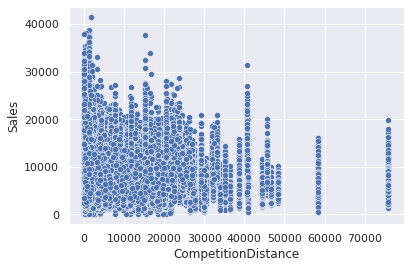

In [8]:
# Using Seaborns scatterplot, feed it the df_proximity data and look for a linear relationship
sns.scatterplot(x='CompetitionDistance', y='Sales', data=df_proximity)

Since it's hard to tell if there is any linear relationship, we will use Pearson's r to see if statisically there is a linear relationship between 'CompetitionDistance' and 'Sales'

In [9]:
# Using the stats library, we will conduct a Pearson r test to determine linear relationships
stats.pearsonr(df_proximity['CompetitionDistance'], df_proximity['Sales'])

(-0.036396088905002844, 9.068992331919184e-245)

From Pearson's r, we can determine that there is a very small inverse linear relationship between 'CompetitionDistance' and 'Sales' (as 'CompetitionDistance' increases 'Sales' slightly decrease)  and that since our p value is very small (p value < 0.05), we can reject the null hypotheses.

~~**H0** = There is no linear relationship between distance to closest competition and total sales.
~~

 <font size="5"> **Ha** = There is a linear relationship between distance to closest competition and total sales. </font>

## **Hypothesis 2**

H0 = There is no linear relationship between distance to closest competition and # of customers.

Ha = There is a linear relationship between distance to closest competition and # of customers.



We will be using Pearson's r again and seeing if there is a similar linear relationship between 'CompetitionDistance' and 'Customers'

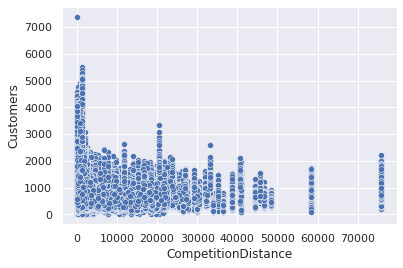

In [10]:
# We will reuse the dataframe from hypothesis 1 and use seaborn again to plot a scatter.
sns.scatterplot(x='CompetitionDistance', y='Customers', data=df_proximity)

While this plot is closer grouped, this is still hard to tell an immediate relationship. Luckily, we can again use the Pearson r test to help us.

In [11]:
#Using the stats library, we will conduct a Pearson r test to determine linear relationships
stats.pearsonr(df_proximity['CompetitionDistance'], df_proximity['Customers'])

(-0.14850619039989565, 0.0)

This time, while very still small, we have a stronger inverse realationship than last time (Customers decrease as distance to competitors increases). With a p-value of zero, we can also reject the null hypothesis.

~~**H0** = There is no linear relationship between distance to closest competition and # of customers.~~

 <font size="5"> **Ha** = There is a linear relationship between distance to closest competition and # of customers. </font>

## **Nearest Competition Conclusion**

While both sales and customers have an inverse linear relationship to distance to competitors, both are very small, almost to the point of not amounting to much. That being said, sales is less dependent on distance to competitors than number of customers is.

# **Promotions**
(Hypotheses 3 and 4)

## **Hypothesis 3**

**H0** = The mean of sales for stores running a promotion equals the mean of sales for stores not running a promotion

**Ha** = The mean of sales for stores running a promotion does not equal the mean of sales for stores not running a promotion

For the next pair of hypotheses, we will be looking at if a store is running a promotion or not and how this effects sales and # of customers (ie. promotions get more customers or if promotions make customers buy more things). We will test to see if there is a difference by using t-tests.

We need two seperate data frames to be able to compare promotions and non-promotion sales.

In [12]:
# Create new data frames from df_open_sales to create a data set with just promo sales, and another with just non-promo sales.
# There are no nulls here, do we do not need to account for them.
df_promo = df_open_sales[df_open_sales['Promo'] == 1]
df_no_promo = df_open_sales[df_open_sales['Promo'] == 0]

Now that we have two new dataframes split on if there was a promotion or not, let's explore these data frames a bit.

In [13]:
# Ensure our new data frames still meet t-test requirements
print("Promo")
print(df_promo.info())
print("Non-Promo")
print(df_no_promo.info())

Promo
<class 'pandas.core.frame.DataFrame'>
Int64Index: 376896 entries, 0 to 1010519
Data columns (total 18 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Store                      376896 non-null  int64  
 1   DayOfWeek                  376896 non-null  int64  
 2   Date                       376896 non-null  object 
 3   Sales                      376896 non-null  int64  
 4   Customers                  376896 non-null  int64  
 5   Open                       376896 non-null  int64  
 6   Promo                      376896 non-null  int64  
 7   StateHoliday               376896 non-null  object 
 8   SchoolHoliday              376896 non-null  int64  
 9   StoreType                  376896 non-null  object 
 10  Assortment                 376896 non-null  object 
 11  CompetitionDistance        375917 non-null  float64
 12  CompetitionOpenSinceMonth  257191 non-null  float64
 13  CompetitionOpenSinceYe

We can now run t-tests to test our null hypthoesis (mean of sales with promos = mean of sales without promos)

In [14]:
# We will use the t-test function from scipy.stats
stats.ttest_ind(df_promo['Sales'],df_no_promo['Sales'])

Ttest_indResult(statistic=363.8446754265649, pvalue=0.0)

With a p-value of zero, we can reject the null hypothesis that the mean of sales with promotions = the mean of sales without promotions. 

We can use a box plot to compare the data sets

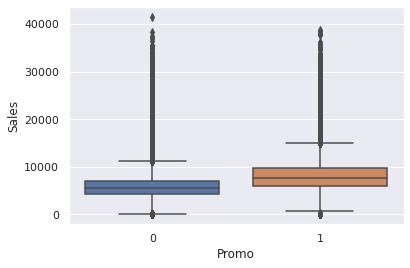

In [15]:
# Create a box plot with seaborn's boxplot where 0 is not promo and 1 is promo
sns.boxplot(y = df_open_sales["Sales"], x = df_open_sales["Promo"])

In [16]:
#use .describe to quantify the quartiles
print("No Promo")
print(df_no_promo['Sales'].describe())
print("Promo")
print(df_promo['Sales'].describe())

No Promo
count    467496.000000
mean       5929.407603
std        2629.648385
min           0.000000
25%        4242.000000
50%        5459.000000
75%        7004.000000
max       41551.000000
Name: Sales, dtype: float64
Promo
count    376896.000000
mean       8228.281239
std        3175.759157
min           0.000000
25%        6069.000000
50%        7649.000000
75%        9686.000000
max       38722.000000
Name: Sales, dtype: float64


Here, we can see the both the mean and median avageages are larger here for sales with promotions than not, and the bottom of the iterquartile range (IQR) for sales with promotions is nearly at the top of the IQR for sales without promotions.

~~**H0** = The mean of sales for stores running a promotion equals the mean of sales for stores not running a promotion.~~

 <font size="5"> **Ha** = The mean of sales for stores running a promotion does not equal the mean of sales for stores not running a promotion. </font>

## **Hypothesis 4**




**H0** = The mean of sales for stores running a promotion equals the mean of sales for stores not running a promotion

**Ha** = The mean of sales for stores running a promotion does not equal the mean of sales for stores not running a promotion

We are going to look at promotions in terms of how it effects # of customers. We can reuse our 'df_promo' and 'df_no_promo' from the previous step for our t-test and 'df_open_sales' for the box plot.

In [17]:
# We will use the t-test function from scipy.stats
stats.ttest_ind(df_promo['Customers'],df_no_promo['Customers'])

Ttest_indResult(statistic=170.89944194816303, pvalue=0.0)

Again, we get a p value of zero, we can reject the null hypothesis, as the mean of customers with promos does not equal the mean of customers without promos. We can illistrate this again with box plots.

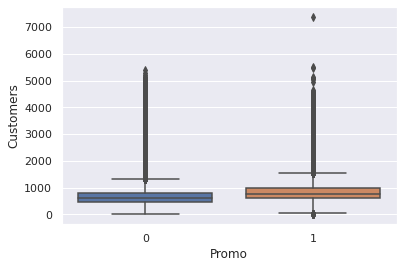

In [18]:
# Create a box plot with seaborn's boxplot where 0 is not promo and 1 is promo
sns.boxplot(y = df_open_sales["Customers"], x = df_open_sales["Promo"])

In [19]:
# Use .describe to quantify the quartiles
print("No Promo")
print(df_no_promo['Customers'].describe())
print("Promo")
print(df_promo['Customers'].describe())

No Promo
count    467496.000000
mean        696.856886
std         388.912683
min           0.000000
25%         469.000000
50%         610.000000
75%         809.000000
max        5387.000000
Name: Customers, dtype: float64
Promo
count    376896.000000
mean        844.434401
std         401.242732
min           0.000000
25%         596.000000
50%         757.000000
75%         981.000000
max        7388.000000
Name: Customers, dtype: float64


As we can see by the lower absolute value of t-statisic, the difference is not as great in terms of mean # of customers with promotions vs without. 

~~**H0** = The mean of # of customers for stores running a promotion equals the mean of # of customers for stores not running a promotion.~~

 <font size="5"> **Ha** = The mean of # of customers for stores running a promotion does not equal the mean of # of customers for stores not running a promotion. </font>

## **Promos Conclusion**

While both sales and # of customers increase in locations that are running promotions, sales does increase more. This could potentially be a way to try and raise sales without relying on raising # of customers.

# **Store Type**

(Hypothesis 5 and 6)

From our Pandas profile, we saw there are 4 store types. Let's take a little bit of a deeper look at these store types.

In [20]:
#Use the value_counts() function to get a count and % of 'StoreType'
print("Number of stores by type:")
print(df_store["StoreType"].value_counts())
print("% of stores by type:")
print(df_store['StoreType'].value_counts(normalize=True))

Number of stores by type:
a    602
d    348
c    148
b     17
Name: StoreType, dtype: int64
% of stores by type:
a    0.539910
d    0.312108
c    0.132735
b    0.015247
Name: StoreType, dtype: float64


As we can see here, store type a makes up nearly 54% of our stores. Lets compare this store type to the rest to see if it performs any better.

## **Hypothesis 5**

**H0** = The mean of sales for store type a equals the mean of sales for stores not store type a

**Ha** = The mean of sales for store type a equal does not the mean of sales for stores not store type a

We will need to create data frames that have just store type a, and a seperate one that does not have store type a. Pandas profile told us that 'StoreType' did not have any nulls, so we do not need to deal with nulls.

In [21]:
# Create two data frames, one with store type a exclusively, and one without store type a
df_store_a = df_open_sales[df_open_sales['StoreType'] == 'a']
df_not_store_a = df_open_sales[df_open_sales['StoreType'] != 'a']

In [22]:
# We will use the t-test function from scipy.stats
stats.ttest_ind(df_store_a['Sales'],df_not_store_a['Sales'])

Ttest_indResult(statistic=-9.759274479725747, pvalue=1.6881749130945476e-22)

With a p-value < 0.05, we can reject the null hypothesis that the mean of sales of store type a = the mean of sales of stores not store type a. Lets look at this a little further.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


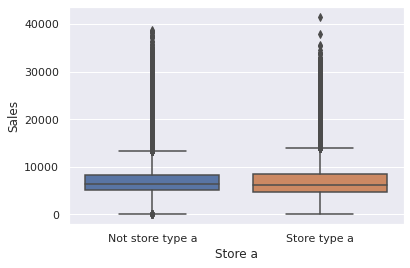

In [23]:
# We need to create a data frame that combines store types b, c, and d into a single group
store_a = []                                      # Create a blank list
for row in df_open_sales['StoreType']:            # Create a loop for all rows in df_open_sales and use column 'StoreType' for conditional statement
  if row == 'a' : store_a.append('Store type a')  # Conditional statement, if 'StoreType' == 'a' then fill list 'store_a' with 'Store type a'
  else:                                           # If 'StoreType' != 'a', fill list 'store_a' with 'Not store type a'.
    store_a.append('Not store type a')
df_open_sales['Store a'] = store_a                # Create a column in the data frame 'df_open_sales' called 'Store a' and it's values == list 'store_a'

# Create a box plot to compare values.
sns.boxplot(y = df_open_sales["Sales"], x = df_open_sales["Store a"])

As the magnitude of our t-statistic shows, the differences between the sales of store type a and stores not type a is small. Lets quantify these with numbers.

In [24]:
# Use .describe to quantify the quartiles
print("Store a")
print(df_store_a['Sales'].describe())
print("Not store a")
print(df_not_store_a['Sales'].describe())

Store a
count    457077.000000
mean       6925.167661
std        3277.786381
min           0.000000
25%        4695.000000
50%        6285.000000
75%        8406.000000
max       41551.000000
Name: Sales, dtype: float64
Not store a
count    387315.000000
mean       6991.326863
std        2885.575716
min           0.000000
25%        5041.000000
50%        6458.000000
75%        8315.000000
max       38722.000000
Name: Sales, dtype: float64


As we can see, the mean, median, and interquartile range value are very similar, with stores that are not store type a performing slightly better. 

~~**H0** = The mean of sales for store type a equals the mean of sales for stores not store type a~~

 <font size="5"> **Ha** = The mean of sales for store type a equal does not the mean of sales for stores not store type a. </font>

## **Hypothesis 6**


**H0** = The mean of customers for store type A equals the mean of customers for stores not store type A

**Ha** = The mean of customers for store type A equal does not the mean of customers for stores not store type A

Let's look at store type and # of customers next. Our data frames are set already so we can go right into testing

In [25]:
# We will use the t-test function from scipy.stats
stats.ttest_ind(df_store_a['Customers'],df_not_store_a['Customers'])

Ttest_indResult(statistic=81.50856500880795, pvalue=0.0)

Here, our p value is zero again, and we can reject the null hypothesis that the mean of customers for store type A equals the mean of customers for stores not store type A. Lets take a look at how this plots.

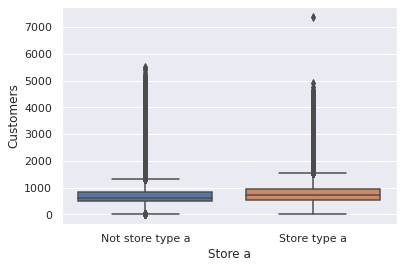

In [26]:
# Create a box plot to compare values.
sns.boxplot(y = df_open_sales["Customers"], x = df_open_sales["Store a"])

While the magnitude of t-statistic here is larger, it's hard to tell a difference. Let's look at the numbers.

In [27]:
# Use .describe to quantify the quartiles
print("Store a")
print(df_store_a['Customers'].describe())
print("Not store a")
print(df_not_store_a['Customers'].describe())

Store a
count    457077.000000
mean        795.361469
std         387.564196
min           0.000000
25%         547.000000
50%         720.000000
75%         949.000000
max        7388.000000
Name: Customers, dtype: float64
Not store a
count    387315.000000
mean        724.217552
std         413.476873
min           0.000000
25%         495.000000
50%         630.000000
75%         821.000000
max        5494.000000
Name: Customers, dtype: float64


Again we can see, the mean, median, and interquartile range value are very similar, with store type a's having slightly more customers. 

~~**H0** = The mean of customers for store type a equals the mean of customers for stores not store type a~~

 <font size="5">**Ha** = The mean of customers for store type a equal does not the mean of customers for stores not store type a.</font>

## **Store Type Conclusion**

This is the most interesting of the 3 sets of hypotheses. While the t-statisic values are small, so the difference isn't that large, but we did see that store type a did better in mean customers but worse in mean sales. In practice, the difference is not great enough to recommend changes. This begs the question, what store type performed the best. We can take a quick peak with box plots.

Sales boxplot
AxesSubplot(0.125,0.125;0.775x0.755)


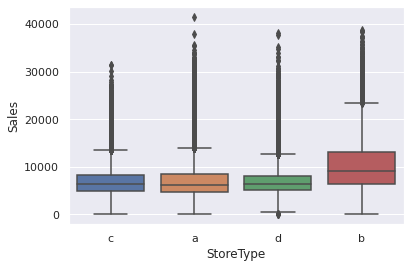

In [28]:
bp_sales = sns.boxplot(y = df_open_sales["Sales"], x = df_open_sales["StoreType"])
print("Sales boxplot")
print(bp_sales)

Customers boxplot
AxesSubplot(0.125,0.125;0.775x0.755)


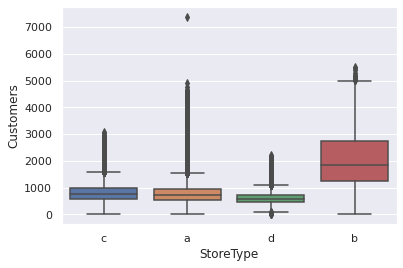

In [30]:
bp_customers = sns.boxplot(y = df_open_sales["Customers"], x = df_open_sales["StoreType"])
print("Customers boxplot")
print(bp_customers)

These show that store type b perform better overall and maybe worth investing in if the cost allows for it.

# **Conclusion**

We learned a lot from our testing. How far away our nearest competitor is has a minimal effect on both sales and customers, promos allow for increased sales more so that increased customers, and we may want to look at cost of remodeling store type a's into store type b's as these perform better for both customers and sales.